#  AI Graphics | NYU 2024
### Name: Qingxin Meng

## Assignment - Part 2

This notebook includes answers to E.1

This notebook takes a total of 350 seconds to run on a 4070ti GPU.

## 0. Install and Import modules

In [1]:
import os
import sys
import torch
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    if torch.__version__.startswith(("2.2.")) and sys.platform.startswith("linux"):
        # We try to install PyTorch3D via a released wheel.
        pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
        version_str="".join([
            f"py3{sys.version_info.minor}_cu",
            torch.version.cuda.replace(".",""),
            f"_pyt{pyt_version_str}"
        ])
        !pip install fvcore iopath
        !pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
    else:
        # We try to install PyTorch3D from source.
        !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

In [2]:
import os
import torch
from pytorch3d.io import load_obj, save_obj,load_objs_as_meshes
from pytorch3d.structures import Meshes
from pytorch3d.utils import ico_sphere,torus
from pytorch3d.ops import sample_points_from_meshes
from pytorch3d.loss import (
    chamfer_distance,
    mesh_edge_loss,
    mesh_laplacian_smoothing,
    mesh_normal_consistency,
)
from pytorch3d.transforms import RotateAxisAngle
import numpy as np
from tqdm.notebook import tqdm
%matplotlib notebook
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 80
mpl.rcParams['figure.dpi'] = 80

from plotly.subplots import make_subplots
torch.manual_seed(777)

# Set the device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")
    print("WARNING: CPU only, this will be slow!")

## 1. Load an obj file and create a Meshes object

In [3]:
# Load the dolphin mesh.
trg_obj = os.path.join('dolphin.obj')

In [4]:
# We read the target 3D model using load_obj
verts, faces, aux = load_obj(trg_obj)

# verts is a FloatTensor of shape (V, 3) where V is the number of vertices in the mesh
# faces is an object which contains the following LongTensors: verts_idx, normals_idx and textures_idx
# For this tutorial, normals and textures are ignored.
faces_idx = faces.verts_idx.to(device)
verts = verts.to(device)

/home/m/miniconda3/envs/pytorch3d/lib/python3.9/site-packages/pytorch3d/io/obj_io.py:544: UserWarning: No mtl file provided
  warnings.warn("No mtl file provided")


In [5]:
# We initialize the source shape to be a sphere of radius 1
src_mesh = ico_sphere(4, device)

In [6]:
##############################################################################
# Code for 1.1
centered_verts = verts-verts.mean()
largest_distance=centered_verts.norm(dim=1).max()
normalized_verts = centered_verts/largest_distance

trg_mesh=Meshes([normalized_verts], [faces_idx])


# Code for 1.2
import plotly.graph_objects as go
import numpy as np


def plotly_submeshes(verts,faces,size):
    specs=[[{"type": "mesh3d"} for i in range(size[1])] for j in range(size[0])]
    fig = make_subplots(size[0],size[1],specs=specs)
    for j in range(size[0]):
        for i in range(size[1]):
            fig.add_trace(go.Mesh3d(x=verts[j][i][:,0],y=verts[j][i][:,1],z=verts[j][i][:,2],i=faces[j][i][:,0],j=faces[j][i][:,1],k=faces[j][i][:,2]),row=j+1,col=i+1)
    return fig


verts1=trg_mesh.verts_packed().cpu()
faces1=trg_mesh.faces_packed().cpu()
#fig1 = go.Figure(data=[go.Mesh3d(x=verts1[:,0], y=verts1[:,1], z=verts1[:,2],i=faces1[:, 0],j=faces1[:, 1],k=faces1[:, 2])])
#fig1.show()
verts5=verts.cpu()

verts2=src_mesh.verts_packed().cpu()
faces2=src_mesh.faces_packed().cpu()
#fig2 =go.Figure(data=[go.Mesh3d(x=verts2[:,0], y=verts2[:,1], z=verts2[:,2],i=faces2[:, 0],j=faces2[:, 1],k=faces2[:, 2])])
#fig2.show()

##############################################################################

###  Visualizing point clouds with Matplotlib

In [7]:
def plot_pointcloud(mesh, title=""):
    # Sample points uniformly from the surface of the mesh.
    points = sample_points_from_meshes(mesh, 5000)
    x, y, z = points.clone().detach().cpu().squeeze().unbind(1)
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter3D(x, z, -y)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_title(title)
    ax.view_init(190, 30)
    plt.show()

# **[EXTRA] E.1 Experiment other coefficients configurations and describe the results.**

In [8]:
##############################################################################
# code for E.1
def weight_experiment(src_mesh,trg_mesh,chamfer,edge,normal,laplacian,iterations):
    # The shape of the deform parameters is equal to the total number of vertices in src_mesh
    deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)
    # The optimizer
    optimizer = torch.optim.SGD([deform_verts], lr=1.0, momentum=0.9)
    # Number of optimization steps
    Niter = iterations
    # Weight for the chamfer loss
    w_chamfer = chamfer
    # Weight for mesh edge loss
    w_edge = edge
    # Weight for mesh normal consistency
    w_normal = normal
    # Weight for mesh laplacian smoothing
    w_laplacian = laplacian
    # Plot period for the losses
    plot_period = 1000
    loop = tqdm(range(Niter))

    chamfer_losses = []
    laplacian_losses = []
    edge_losses = []
    normal_losses = []
    total_losses = []
    %matplotlib inline

    for i in loop:
        # Initialize optimizer
        optimizer.zero_grad()

        # Deform the mesh
        new_src_mesh = src_mesh.offset_verts(deform_verts)

        # We sample 5k points from the surface of each mesh
        sample_trg = sample_points_from_meshes(trg_mesh, 5000)
        sample_src = sample_points_from_meshes(new_src_mesh, 5000)

        # We compare the two sets of pointclouds by computing (a) the chamfer loss
        loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)

        # and (b) the edge length of the predicted mesh
        loss_edge = mesh_edge_loss(new_src_mesh)

        # mesh normal consistency
        loss_normal = mesh_normal_consistency(new_src_mesh)

        # mesh laplacian smoothing
        loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")

        # Weighted sum of the losses
        loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian

        # Print the losses
        loop.set_description('total_loss = %.6f' % loss)

        # Save the losses for plotting
        chamfer_losses.append(float(loss_chamfer.detach().cpu()))
        edge_losses.append(float(loss_edge.detach().cpu()))
        normal_losses.append(float(loss_normal.detach().cpu()))
        laplacian_losses.append(float(loss_laplacian.detach().cpu()))
        total_losses.append(float(loss.detach().cpu()))

        # Plot mesh
        if i % plot_period == 0:
            plot_pointcloud(new_src_mesh, title="iter: %d" % i)

        if i == 2000:
            for param_group in optimizer.param_groups:
                param_group['lr'] /= 2

        # Optimization step
        loss.backward()
        optimizer.step()

    final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)
    return final_verts, final_faces
##############################################################################

  0%|          | 0/2000 [00:00<?, ?it/s]

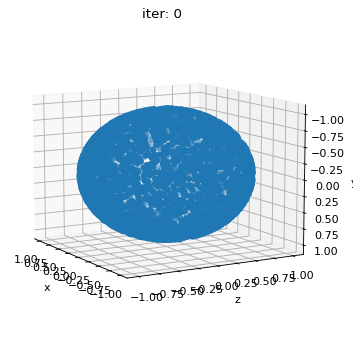

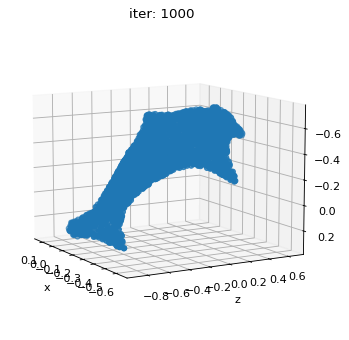

  0%|          | 0/2000 [00:00<?, ?it/s]

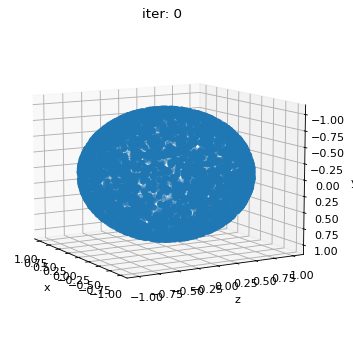

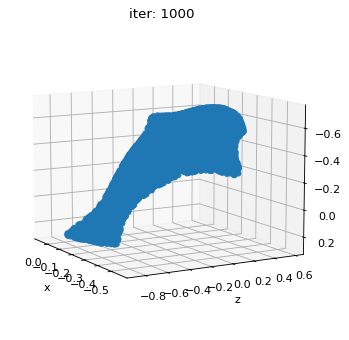

In [9]:

# code for E.1 part 1 (edge length weight)
final_verts,final_faces = weight_experiment(src_mesh,trg_mesh,1.0,0.5,0.01,0.1,2000)

final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts8 = final_verts_nback.detach().cpu()
faces8 = final_faces.cpu()

final_verts,final_faces =weight_experiment(src_mesh,trg_mesh,1.0,2.0,0.01,0.1,2000)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts9 = final_verts_nback.detach().cpu()
faces9 = final_faces.cpu()

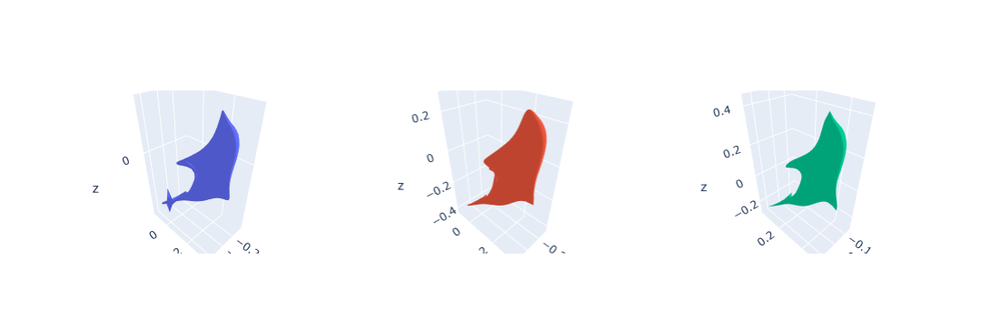

In [10]:
##############################################################################
# code for E.1 part 1 (visualization)
plotly_submeshes([[verts8,verts9,verts5]],[[faces8,faces9,faces1]],(1,3))

## Discussion for E.1 part 1 (experiment on edge length weight)

Above, the first figure (the blue mesh) represents the mesh optimized with an edge length weight of 0.5, the second with a weight of 2.0, and the third is the target mesh.

We observed that the first mesh is not smooth enough to be identified as a dolphin, suffering from stretching artifacts in mouth part and at the tip of tail. This indicates that the low edge length loss allows longer egdes exists, and further forms those streching artifacts.

For the second mesh (the red mesh), it almost achieves to be a good shape of a dolphin. Nevertheless, the left part of the dolphin has a little artifacts, failing to maintain the overall smooth of the optimizied mesh. We can infer that the spike shape artifacts is caused by the high edge length loss which enforcing shorter edges.

  0%|          | 0/2000 [00:00<?, ?it/s]

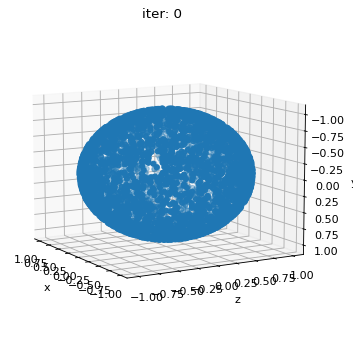

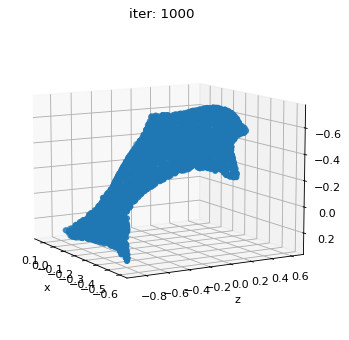

  0%|          | 0/2000 [00:00<?, ?it/s]

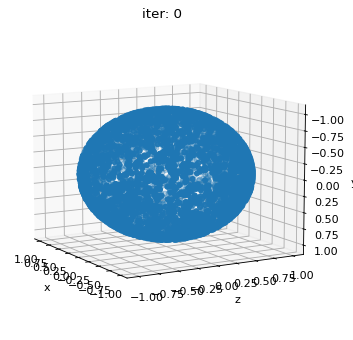

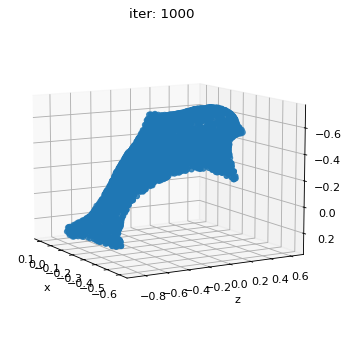

In [11]:
# code for E.1 part 2 (normal consistency weight)
final_verts,final_faces = weight_experiment(src_mesh,trg_mesh,1.0,1.0,0.02,0.1,2000)
 
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts10 = final_verts_nback.detach().cpu()
faces10 = final_faces.cpu()

final_verts,final_faces =weight_experiment(src_mesh,trg_mesh,1.0,1.0,0.005,0.1,2000)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts11 = final_verts_nback.detach().cpu()
faces11 = final_faces.cpu()

In [12]:
##############################################################################
# code for E.1 part 2 (visualization)
plotly_submeshes([[verts10,verts11,verts5]],[[faces10,faces11,faces1]],(1,3))

## Discussion for E.1 part 2 (experiment on normal consistency weight)

~~We know that normal consistency is a local smooth constraint, and we expect that larger weight of normal consistency makes the mesh more smooth while lower has opposite effect. However the results of experienment are not as expected. Both optimized meshes characterize obvious artifacts on the tail part. We think that the first optimized mesh with larger weight of normal consistency needs more iteration to make sure conversion. Thus we decided to optimize with the same configuration again except through 4000 iterations. The optimization is shown below.~~

Note: The discussion above is based on another optimization process. However, with some randomness, 2000 iterations seems to be enough for normal conssitency weight loss experiment, you can check the discussion in following discussion section. 

  0%|          | 0/4000 [00:00<?, ?it/s]

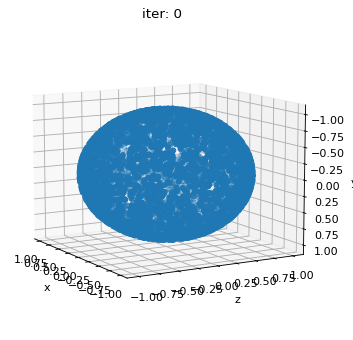

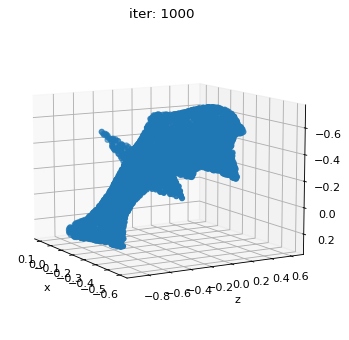

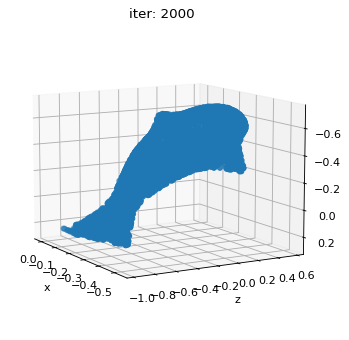

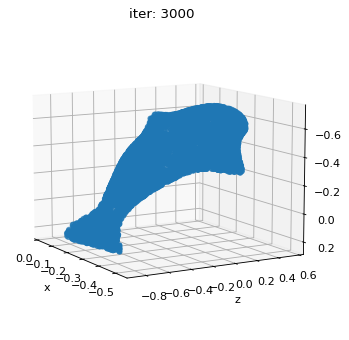

  0%|          | 0/4000 [00:00<?, ?it/s]

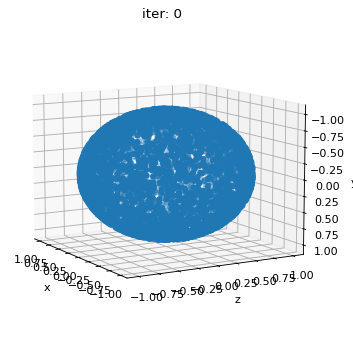

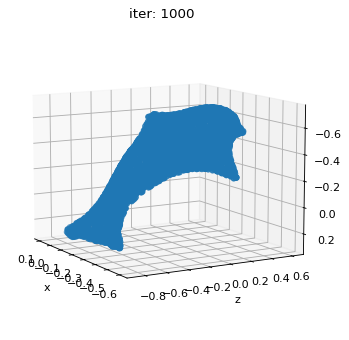

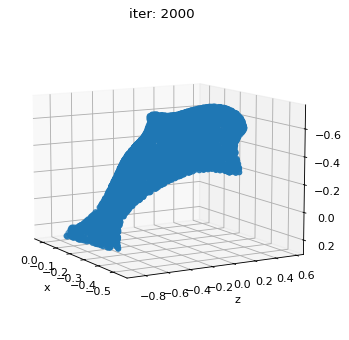

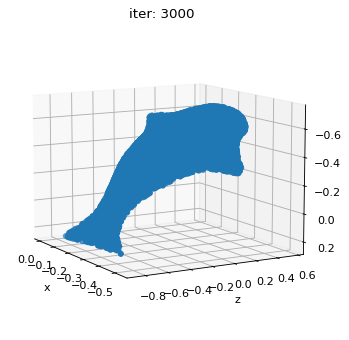

In [13]:
# code for E.1 part 2 (normal consistency weight, 4000 iterations)
final_verts,final_faces = weight_experiment(src_mesh,trg_mesh,1.0,1.0,0.02,0.1,4000)
 
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts12 = final_verts_nback.detach().cpu()
faces12 = final_faces.cpu()

final_verts,final_faces =weight_experiment(src_mesh,trg_mesh,1.0,1.0,0.005,0.1,4000)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts13 = final_verts_nback.detach().cpu()
faces13 = final_faces.cpu()

In [14]:
##############################################################################
# code for E.1 part 2 (visualization)
plotly_submeshes([[verts12,verts13,verts5]],[[faces12,faces13,faces1]],(1,3))

## Discussion for E.1 part 2 continued (experiment on normal consistency weight)

The final meshes are now in the perfect shape of a dolphin. The only difference we find is that the dorsal fin of the first mesh is smoother. This proves that the lower the normal consistency loss, the smoother the optimized mesh is.

  0%|          | 0/2000 [00:00<?, ?it/s]

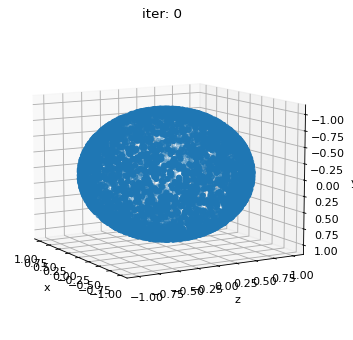

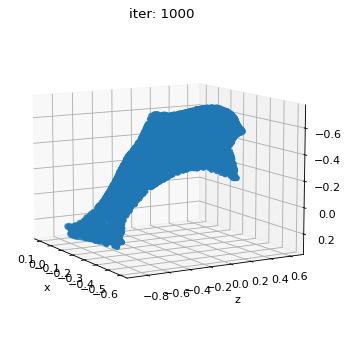

  0%|          | 0/2000 [00:00<?, ?it/s]

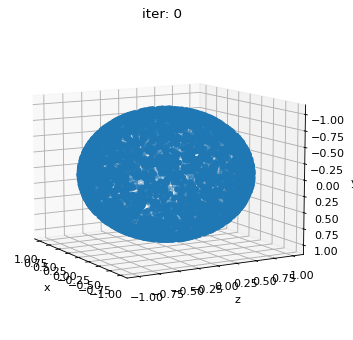

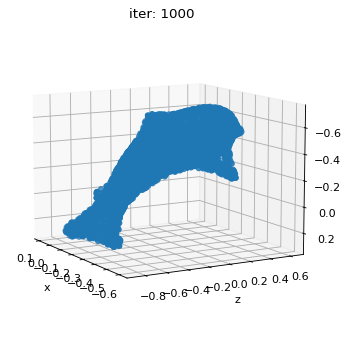

In [15]:
# code for E.1 part 3 (laplacian smoothing weight)
final_verts,final_faces = weight_experiment(src_mesh,trg_mesh,1.0,1.0,0.01,0.2,2000)
 
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts14 = final_verts_nback.detach().cpu()
faces14 = final_faces.cpu()

final_verts,final_faces =weight_experiment(src_mesh,trg_mesh,1.0,1.0,0.01,0.05,2000)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts15 = final_verts_nback.detach().cpu()
faces15 = final_faces.cpu()

In [16]:
##############################################################################
# code for E.1 part 3 (visualization)
plotly_submeshes([[verts14,verts15,verts5]],[[faces14,faces15,faces1]],(1,3))

## Discussion for E.1 part 3 (experiment on laplacian smoothing) 

The first figure is optimized by doubled laplacian smoothing weight while the second by halved weight.

The laplacian smoothing is a local smooth factor similar to normal consistency. The first figure is oversmoothed while the second figure seems to have a relatively rough surface.

  0%|          | 0/2000 [00:00<?, ?it/s]

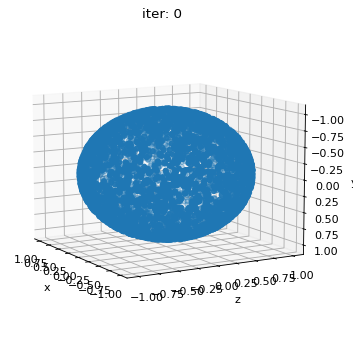

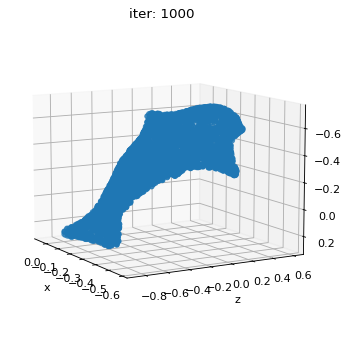

  0%|          | 0/2000 [00:00<?, ?it/s]

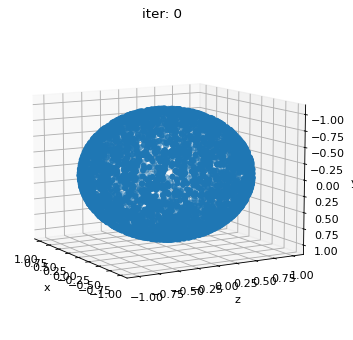

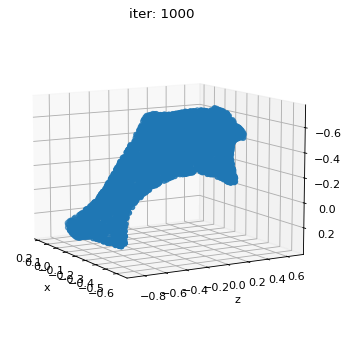

In [17]:
# code for E.1 part 4 (chamfer loss weight)
final_verts,final_faces = weight_experiment(src_mesh,trg_mesh,2.0,1.0,0.01,0.1,2000)
 
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts16 = final_verts_nback.detach().cpu()
faces16 = final_faces.cpu()

final_verts,final_faces =weight_experiment(src_mesh,trg_mesh,0.5,1.0,0.01,0.1,2000)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts17 = final_verts_nback.detach().cpu()
faces17 = final_faces.cpu()

In [18]:
##############################################################################
# code for E.1 part 4 (visualization)
plotly_submeshes([[verts16,verts17,verts5]],[[faces16,faces17,faces1]],(1,3))

## Discussion for E.1 part 4 (experiment on chamfer loss)

The chamfer loss is a reconstruction loss that is essential in constructing a dolphin shape. The first figure is generated with doubled chamfer loss weight, and the second with halved chamfer loss weight.

With lower chamfer loss, the first figure maintains a better dolphin shape.

## Conclusion for E.1

Well-designed loss weights are constraints that play an important role in constructing a good and accurate mesh. We have experimented with different configurations by changing a single weight to optimize a new mesh. Changing a single weight without considering other weights creates imbalance among those constraints, and that is the main reason most of these experiments show dolphin meshes with flaws.